## Created by : Lucrece Shin

## Contact : lucrece.shin@mail.utoronto.ca

# 1. Import Libraries and Mount GDrive

Make sure your notebook has GPU running.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time, os, pickle
from PIL import Image, ImageFile
from collections import OrderedDict, deque, Counter
from sklearn.metrics import confusion_matrix, classification_report
import cv2 

import torch
import torchvision
import torch.nn.functional as F
from torch import nn, optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, Dataset
from torch.autograd import Variable
from torch.utils import model_zoo

try:
    from torch.hub import load_state_dict_from_url
except ImportError:
    from torch.utils.model_zoo import load_url as load_state_dict_from_url

ImageFile.LOAD_TRUNCATED_IMAGES = True
use_cuda = torch.cuda.is_available()

In [2]:
!rm -r sample_data
from google.colab import drive, files
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# 2. Define Dataloaders
Define your own dataloaders. For me I am loading web images & Xray images dataloaders.

## 2.1 Load web images

In [3]:
!cp 'gdrive/My Drive/web_3cls+NOcutter.zip' . #web_2cls+benign.zip' . #'gdrive/My Drive/web_2cls+bag_SPLIT.zip' .
!unzip -qq web_3cls+NOcutter.zip
!rm web_3cls+NOcutter.zip 

In [4]:
!cp -r web_3cls+NOcutter web_3cls

!mv web_3cls/train/knife+*/* web_3cls/train/knife/
!rm -r web_3cls/train/gun+knife
!mv web_3cls/train/gun+*/* web_3cls/train/gun/
!rm -r web_3cls/train/*+*

!mv web_3cls/valid/knife+*/* web_3cls/valid/knife/
!mv web_3cls/valid/gun+*/* web_3cls/valid/gun/
!rm -r web_3cls/valid/*+*

In [5]:
transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()])

In [6]:
root_dir = "web_3cls/" #"web_2class_SPLIT/"  # 2 classes
train_data_3cls = datasets.ImageFolder(root_dir + 'train', transform=transform)
valid_data_3cls = datasets.ImageFolder(root_dir + 'valid', transform=transform)
test_data_3cls = datasets.ImageFolder(root_dir + 'test', transform=transform)
print("Classes: ", train_data_3cls.classes)
print("Class2idx: ", train_data_3cls.class_to_idx)
print('Train images :', len(train_data_3cls))
print('Valid images :', len(valid_data_3cls))
print('Test images :', len(test_data_3cls))
num_workers = 0
batch_size = 16
dataloaders_3cls = {}
dataloaders_3cls['train'] = DataLoader(train_data_3cls, batch_size=batch_size, num_workers=num_workers, shuffle=True)
dataloaders_3cls['valid'] = DataLoader(valid_data_3cls, batch_size=batch_size, num_workers=num_workers, shuffle=True)
dataloaders_3cls['test'] = DataLoader(test_data_3cls, batch_size=batch_size, num_workers=num_workers, shuffle=True)

Classes:  ['benign', 'gun', 'knife']
Class2idx:  {'benign': 0, 'gun': 1, 'knife': 2}
Train images : 5016
Valid images : 645
Test images : 627


In [7]:
!cp 'gdrive/My Drive/web_2class_SPLIT.zip' .
!unzip -qq web_2class_SPLIT.zip
!rm web_2class_SPLIT.zip 

In [8]:
root_dir = "web_2class_SPLIT/" #"web_2class_SPLIT/"  # 2 classes
train_data = datasets.ImageFolder(root_dir + 'train', transform=transform)
valid_data = datasets.ImageFolder(root_dir + 'valid', transform=transform)
test_data = datasets.ImageFolder(root_dir + 'test', transform=transform)
print("Classes: ", train_data.classes)
print("Class2idx: ", train_data.class_to_idx)
print('Train images :', len(train_data))
print('Valid images :', len(valid_data))
print('Test images :', len(test_data))
num_workers = 0
batch_size = 16
dataloaders = {}
dataloaders['train'] = DataLoader(train_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)
dataloaders['valid'] = DataLoader(valid_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)
dataloaders['test'] = DataLoader(test_data, batch_size=batch_size, num_workers=num_workers, shuffle=True)

Classes:  ['gun', 'knife']
Class2idx:  {'gun': 0, 'knife': 1}
Train images : 1724
Valid images : 215
Test images : 215


In [9]:
# Check how many training images there are for each class
!ls web_3cls+NOcutter/train/gun|wc -l
!ls web_3cls+NOcutter/train/knife|wc -l
!ls web_3cls+NOcutter/train/benign|wc -l

602
1270
2204


## 2.2 Load Xray images

In [10]:
!cp 'gdrive/My Drive/Xray-3cls_small.zip' .  # Xray-3cls_small_kitchen.zip
!unzip -qq Xray-3cls_small.zip
!rm Xray-3cls_small.zip 
# remove Kitchen knife & Cutter knife images
!mkdir kitchen_knife
!mkdir cutter_knife
!mv Xray-3cls_small/knife/Kitchen* kitchen_knife/
!mv Xray-3cls_small/knife/Cutter* cutter_knife/

In [11]:
!mkdir xray_sh
!mkdir xray_sh/gun
!mkdir xray_sh/knife
!mkdir xray_sh/benign_inch
# sharpen Xray images
img_dir = "Xray-3cls_small"
classes = os.listdir(img_dir)
for cls_i, cls in enumerate(classes):
  gun_filters_activations, knife_filters_activations = [], []
  for i, img_path in enumerate(os.listdir(os.path.join(img_dir, cls))):
    full_img_path = os.path.join(img_dir, cls, img_path)
    img = plt.imread(full_img_path)
    kernel = np.array([[-1,-1,-1], [-1,9.5,-1], [-1,-1,-1]])
    im = cv2.filter2D(img, -1, kernel)
    plt.imsave("xray_sh/"+cls+"/sh_"+img_path, im)

In [12]:
# 3 classes : gun, knife, benign
data_path = 'xray_sh'
num_workers = 0
batch_size = 16#50 
xray_dataset = datasets.ImageFolder(data_path, transform=transform) # resize only
xray_dataloader = DataLoader(xray_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True)
print("Classes: ", xray_dataset.classes)
print("Number of Xray images : {}    Number of Xray batches : {}  (batch size={})".format(len(xray_dataset), len(xray_dataloader), batch_size))

Classes:  ['benign_inch', 'gun', 'knife']
Number of Xray images : 450    Number of Xray batches : 29  (batch size=16)


In [13]:
!mkdir xray_gun
!mkdir xray_knife
!mkdir xray_benign
!cp -r xray_sh/gun xray_gun/
!cp -r xray_sh/knife xray_knife/
!cp -r xray_sh/benign_inch xray_benign/

data_path_gun = 'xray_gun/'
data_path_knife = 'xray_knife/'
data_path_benign = 'xray_benign/'
num_workers = 0
batch_size = 16
xray_gun_dataset = datasets.ImageFolder(data_path_gun, transform=transform) # resize only
xray_gun_dataloader = DataLoader(xray_gun_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True)
print("Classes: ", xray_gun_dataset.classes)
print("Number of Xray images : {}".format(len(xray_gun_dataset)))

xray_knife_dataset = datasets.ImageFolder(data_path_knife, transform=transform) # resize only
xray_knife_dataloader = DataLoader(xray_knife_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True)
print("Classes: ", xray_knife_dataset.classes)
print("Number of Xray images : {}".format(len(xray_knife_dataset)))

xray_benign_dataset = datasets.ImageFolder(data_path_benign, transform=transform) # resize only
xray_benign_dataloader = DataLoader(xray_benign_dataset, batch_size=batch_size, num_workers=num_workers, shuffle=True)
print("Classes: ", xray_benign_dataset.classes)
print("Number of Xray images : {}".format(len(xray_benign_dataset)))

Classes:  ['gun']
Number of Xray images : 117
Classes:  ['knife']
Number of Xray images : 33
Classes:  ['benign_inch']
Number of Xray images : 300


# 3. Define Model(s)
Here I am defining 3 models to make comparisons by loading pre-trained model dicts. You can define your own model here. 

## Model # 1
* VGG16 
* pre-trained on ImageNet 
* fine-tuned for **gun vs. knife binary classification**

In [14]:
# Define Model 
model_1 = models.vgg16(pretrained=True)
model_1.classifier[-1] = nn.Linear(in_features=4096, out_features=2, bias=True)

# Load trained weights 
!cp gdrive/MyDrive/model_10.pt .
model_1.load_state_dict(torch.load("model_10.pt"))

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

<All keys matched successfully>

## Model #2
* ResNet50 
* pre-trained on [Stylized ImageNet](https://arxiv.org/abs/1811.12231) 
* fine-tuned for benign vs. gun vs. knife [multi-label classification](https://medium.com/@lucrece.shin/ch-6-optimizing-data-for-flexible-and-robust-image-recognition-23f4dcce3af7)

In [20]:
# from : https://github.com/rgeirhos/texture-vs-shape
def load_model(model_name):
    model_urls = {
            'resnet50_trained_on_SIN': 'https://bitbucket.org/robert_geirhos/texture-vs-shape-pretrained-models/raw/6f41d2e86fc60566f78de64ecff35cc61eb6436f/resnet50_train_60_epochs-c8e5653e.pth.tar',
            'resnet50_trained_on_SIN_and_IN': 'https://bitbucket.org/robert_geirhos/texture-vs-shape-pretrained-models/raw/60b770e128fffcbd8562a3ab3546c1a735432d03/resnet50_train_45_epochs_combined_IN_SF-2a0d100e.pth.tar',
            'resnet50_trained_on_SIN_and_IN_then_finetuned_on_IN': 'https://bitbucket.org/robert_geirhos/texture-vs-shape-pretrained-models/raw/60b770e128fffcbd8562a3ab3546c1a735432d03/resnet50_finetune_60_epochs_lr_decay_after_30_start_resnet50_train_45_epochs_combined_IN_SF-ca06340c.pth.tar',
            'alexnet_trained_on_SIN': 'https://bitbucket.org/robert_geirhos/texture-vs-shape-pretrained-models/raw/0008049cd10f74a944c6d5e90d4639927f8620ae/alexnet_train_60_epochs_lr0.001-b4aa5238.pth.tar',
    }
    if "resnet50" in model_name:
        print("Using the ResNet50 architecture.")
        model = torchvision.models.resnet50(pretrained=False)
        model = torch.nn.DataParallel(model)#.cuda()
        checkpoint = model_zoo.load_url(model_urls[model_name])
    else:
        raise ValueError("unknown model architecture.")

    model.load_state_dict(checkpoint["state_dict"])
    return model

In [21]:
# Define Model 
model_2 = load_model("resnet50_trained_on_SIN_and_IN_then_finetuned_on_IN").module
model_2.fc = nn.Linear(in_features=2048, out_features=3, bias=True)

# Load trained weights 
!cp gdrive/MyDrive/model_10_SIN_noADDA.pt .
model_2.load_state_dict(torch.load("model_10_SIN_noADDA.pt"))

Using the ResNet50 architecture.


Downloading: "https://bitbucket.org/robert_geirhos/texture-vs-shape-pretrained-models/raw/60b770e128fffcbd8562a3ab3546c1a735432d03/resnet50_finetune_60_epochs_lr_decay_after_30_start_resnet50_train_45_epochs_combined_IN_SF-ca06340c.pth.tar" to /root/.cache/torch/hub/checkpoints/resnet50_finetune_60_epochs_lr_decay_after_30_start_resnet50_train_45_epochs_combined_IN_SF-ca06340c.pth.tar


  0%|          | 0.00/195M [00:00<?, ?B/s]

<All keys matched successfully>

## Model #3 
* ResNet50 
* pre-trained on [Stylized ImageNet](https://arxiv.org/abs/1811.12231) 
* fine-tuned for benign vs. gun vs. knife [multi-label classification](https://medium.com/@lucrece.shin/ch-6-optimizing-data-for-flexible-and-robust-image-recognition-23f4dcce3af7)
* trained with [Adversarial Discriminative Domain Adaptation (ADDA)](https://arxiv.org/abs/1702.05464) with Xray images

In [22]:
# Define Model 
model_3 = load_model("resnet50_trained_on_SIN_and_IN_then_finetuned_on_IN").module
model_3.fc = nn.Linear(in_features=2048, out_features=3, bias=True)

Using the ResNet50 architecture.


Here I am separating the model into the **encoder** (everything before the last fully connected layer) and **classifier** (last fully connected layer) because it was trained that way. You don't have to do this if your model wasn't trained this way.

In [23]:
# Load trained weights 
!cp gdrive/MyDrive/*Jul18.pt .

encoder_model_3 = nn.Sequential(*[model_3.conv1, model_3.bn1, model_3.relu, model_3.maxpool, model_3.layer1, model_3.layer2, model_3.layer3, model_3.layer4, model_3.avgpool])
encoder_model_3.load_state_dict(torch.load("ADDA-encoder-10-Jul18.pt"))

classifier_model_3 = nn.Linear(in_features=2048, out_features=3, bias=True)
classifier_model_3.load_state_dict(torch.load("ADDA-classifier-10-Jul18.pt"))

<All keys matched successfully>

#4. Define **Feature Map Visualizer Class**

This is the main code for the visualization methods. Each method is defined as a function inside the **FeatureMapVisualizer** class.

In [24]:
class SaveFeatures():
    ''' Save Forward Progapation Activations of Feature Maps of a requested module (=layer)'''
    def __init__(self, module):
        self.hook = module.register_forward_hook(self.hook_fn)
        self.features = None
        self.params = None

    def hook_fn(self, module, input, output):
        ''' Save output of the requested layer (module) to self.features '''
        self.features = output 
        for p in module.parameters():
          if len(p.shape)==4:
            self.params = p
            break

    def close(self):
        self.hook.remove()

In [47]:
class FeatureMapVisualizer():
    def __init__(self, 
                 model,  
                 model_type="resnet", 
                 ec=False): 
        '''
        ### Feature Map Visualization class:  ###
          Contains various functions for visualization methods using convolutional feature maps
          || PARAMETERS ||
            model       : (PyTorch model)
            model_type  : (str) must be "resnet" or "vgg"
            ec          : (bool) True if using encoder, False if using the whole model (encoder + classifier)
        '''
        assert model_type in ["resnet", "vgg"], 'mode_type must be either "resnet" or "vgg"!'
        self.model = model.eval().cuda() if use_cuda else model.eval()
        for p in self.model.parameters(): p.requires_grad=False
        self.model_type = model_type
        self.ec = ec
    

    def register_hook(self, layer):
        ''' Register hook in the requested layer '''
        if self.model_type == "vgg":
            conv_layers = [c for c in list(self.model.children())[0] if isinstance(c, nn.Conv2d)]
            activations = SaveFeatures(conv_layers[layer])  # register hook

        elif self.model_type == "resnet":
            if self.ec:
                activations = SaveFeatures(self.model[-2][-2])
            else:
                activations = SaveFeatures(self.model.layer4[layer])
        return activations
    

    def find_unique_filters(self, 
                            layer, 
                            train_dir, 
                            classes, 
                            n_imgs_dict, 
                            n1=25, 
                            n2=25):
        '''
        || PARAMETERS ||
          layer       : (int) if using last convolutional layer, use -2 for resnet & 12 for vgg16
          train_dir   : (str) address of the folder that contains training data including "/" at the end  e.g. "train_data/"
          classes     : (list of strs) list containing (at least two) class names in string e.g. ["cat", "dog"]
          n_imgs_dict : (dict) key : class name (str), value : # of training images for that class (int) e.g. {"dog":955, "cat":1857}
          n1          : (int) # of top feature maps to save for EACH IMAGE
          n2          : (int) # of top feature maps to save for EACH CLASS
          ec          : (bool) True if using encoder, False if using the whole model (encoder + classifier)
        '''

        cls_dirs = [train_dir + cls for cls in classes]
        top_feature_maps_dict_each_image = {}  # dict to save top feature maps for ALL images for each class
        n_maps_last_layer = 2048 if self.model_type=="resnet" else 512

        ##########  Top Feature maps for EACH IMAGE  ##########
        for dir in cls_dirs: # iterate over class
          top_filters = []  

          ### for EACH IMAGE of the class ###
          for img_path in os.listdir(dir): 
            ### Save activations of ALL feature maps for the image ###
            activations_list = self.one_image(layer, os.path.join(dir, img_path), plot=False, print_logits=False)
            
            ### Add top n1 most activated feature maps of the image to the "top filters" list ###
            top_filters.extend(list(activations_list.detach().cpu().numpy().argsort()[::-1][:n1]))
          cls = dir.split("/")[-1]  # class name

          ### Add the aggregated list of the class to the dict ###
          top_feature_maps_dict_each_image[cls] = top_filters
          print(cls + " done.")

        ##########  Top Feature maps for EACH CLASS  ##########
        top_feature_map_dict_each_class = {}  # dict to save top feature maps for each class
        for cls in classes:
          ### Count the feature maps appearing in each class's aggregated list of top feature maps for ALL images ###
          frequency_counters = Counter(top_feature_maps_dict_each_image[cls])

          ### Calculate the frequency ratio for each feature map
          frequency_ratios = [frequency_counters[i]/n_imgs_dict[cls] if i in frequency_counters.keys() else 0. for i in range(n_maps_last_layer)]

          ### Add top n2 most frequent feature maps of the class to the dict ###
          top_feature_map_dict_each_class[cls] = np.argsort(frequency_ratios)[::-1][:n2]

        ###  Eliminate feature maps that exist in more than one classes' top feature map lists  ###
        unique_top_feature_map_dict_each_class = {}
        for cls in classes:
          dict_without_this_class = {key:list(val) for key, val in top_feature_map_dict_each_class.items() if key != cls}
          if len(classes) > 2:  
            unique_top_feature_map_dict_each_class[cls] = [map for map in top_feature_map_dict_each_class[cls] if map not in set(sum(dict_without_this_class.values(), []))]
          elif len(classes) == 2:  
            unique_top_feature_map_dict_each_class[cls] = [map for map in top_feature_map_dict_each_class[cls] if map not in list(dict_without_this_class.values())[0]]

        print("# of top feature maps:", {key:len(val) for key, val in unique_top_feature_map_dict_each_class.items()})

        return  unique_top_feature_map_dict_each_class


    def visualize_patterns(self, 
                          layer,  
                          filter_n, 
                          init_size=33, 
                          lr=0.2, 
                          opt_steps=20,  
                          upscaling_steps=20, 
                          upscaling_factor=1.2, 
                          print_loss=False, 
                          plot=False):
        ''' 
        ###  VISUALIZATION #1 :  ###
          Visualize patterns captured by a single feature map
        
          || PARAMETERS ||
            layer            : (int) index of the convolutional layer to investigate feature maps 
                               *For the last convolutional layer, use -2 for resent50 & 12 for vgg16
            filter_n         : (int) index of the feature map to investigate in the layer
            init_size        : (int) intial length of the square random image
            lr               : (float) learning rate for pixel optimization
            opt_steps        : (int) number of optimization steps
            upscaling_steps  : (int) # of upscaling steps
            upscaling_factor : (float) >1, upscale factor
            log_info         : (bool) if True, log info at each optimizing iteration
                               *if activation: 0 for all iterations, there's a problem
            plot             : (bool) if True, plot the generated image at each optimizing iteration
        '''
        activations = self.register_hook(layer)

        ### Generate a random image ###
        img = np.uint8(np.random.uniform(150, 180, (init_size, init_size, 3)))/255  
        sz = init_size
        if print_loss:
            plt.imshow(img)
            plt.title("original random image")
            plt.show()

        ### Upscale the image (upscaling_steps) times ###
        for upscale_i in range(upscaling_steps):  
            ### Attach graients to the optimized image ###
            img_var = torch.autograd.Variable(torch.Tensor(img.transpose((2,0,1))).cuda().unsqueeze(0), requires_grad=True)
            
            ### Define Optimizer to update the image pixels ###
            optimizer = torch.optim.Adam([img_var], lr=lr, weight_decay=1e-6)

            ### Update the image's pixel values for (opt_steps) times ### 
            for n in range(opt_steps):  
                optimizer.zero_grad()

                ### Pass the image through the model ###
                # Use sigmoid to restrict the image pixels between 0 and 1. 
                # Without sigmoid, the pixels can become negative. 
                self.model(torch.sigmoid(img_var)) 

                ### Maximize the activation of the (filter_n)th feature map of the requested layer ###
                loss = -activations.features[0, filter_n].mean() 
                if plot:
                    plt.imshow(activations.features[0, filter_n].detach().cpu().numpy(), cmap="gray")
                    plt.show()
                if print_loss: 
                    print("whole layer shape:", activations.features.shape) # [1, n_filter, intermediate_H, intermediate_W]
                    print("intermediate feature shape:", activations.features[0, filter_n].shape)
                    print("parameters shape:", activations.params.shape)         
                    print("activation:", activations.features[0, filter_n].mean().item())
                loss.backward()
                optimizer.step()

            if print_loss: 
                print()

            if upscale_i < upscaling_steps - 1: 
                img = img_var.detach().cpu().numpy()[0].transpose(1,2,0)
                ### Scale the optimized image up ###
                sz = int(upscaling_factor * sz)  # calculate new image size
                img = cv2.resize(img, (sz, sz), interpolation = cv2.INTER_CUBIC)  
            else:
                ### for the last iteration, convert img_var into a numpy array ###
                img = torch.sigmoid(img_var).detach().cpu().numpy()[0].transpose(1,2,0)

        ### Remove hook ###
        activations.close()  

        ### Save the generated image ###
        img_name = "layer_"+str(layer)+"_filter_"+str(filter)+".jpg"
        plt.imsave(img_name, img)

        return img, img_name


    def make_img_var(self, img_path):
        ''' 
        Given a path to an image (str), convert the image into a PyTorch variable
        '''
        img = Image.open(img_path).convert('RGB')    
        transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()])
        img = transform(img)[:3, :, :].unsqueeze(0)    
        img_var = torch.autograd.Variable(img.cuda(), requires_grad=True) if use_cuda else torch.autograd.Variable(img, requires_grad=True)
        
        return img, img_var


    def one_image(self, 
                  layer, 
                  img_path, 
                  n=5, 
                  plot=True,
                  n_plots_horiz=1, 
                  n_plots_vert=5, 
                  plot_h=50, 
                  plot_w=50,
                  print_logits=False, 
                  imagenet=False, 
                  plot_overlay=True,
                  n_top_classes=5):  
        '''
        ###  VISUALIZATION #2 :  ###
          1. Find top n feature maps for a single image.
          2. Highlight each top feature map's most attended regions of the image 
             by overlaying its activation map on top of the image.

        || PARAMETERS ||
          layer            : (int) index of the convolutional layer to investigate feature maps 
                              *For the last convolutional layer, use -2 for resent50 & 12 for vgg16
          img_path      : (str) path to the image to investigate
          n             : (int) # of top feature maps to plot
          plot          : (bool) if True, plot the top N feature maps' activation maps on the image
          n_plots_horiz : (int) # of feature maps to plot horizontally
          n_plots_vert  : (int) # of feature maps to plot vertically
            /// n_plots_horiz * n_plots_vert MUST be equal to n ///
          plot_h        : (int) height of the plot
          plot_w        : (int) width of the plot
            /// it's recommended that (n_plots_horiz/n_plots_vert) = (plot_h/plot_w) ///
          print_logits  : (bool) if True, print model logits (outputs) for the image
          imagenet      : (bool) if True, print_logits will print the logits for corresponding imagenet labels
          plot_overlay  : (bool) if True, overlay the top feature map on top of the image and plot the overlaid image
                                    if False, plot the original feature map only
        '''

        activations = self.register_hook(layer)

        ### Convert the image into a pytorch variable ###
        img, img_var = self.make_img_var(img_path)

        ### Pass the image through the model ###
        logits = self.model(img_var)

        ### Save the activations of ALL feature maps in the requested convolutional layer ###
        activations_list = activations.features[0].mean((1,2)).detach().cpu()

        ### Save only the top N most activated feature maps, in order of largest to smallest activations ###
        topN_activated_filters = np.array(activations_list).argsort()[::-1][:n]

        if plot:
            assert n_plots_horiz*n_plots_vert==n, "n_plots_horiz*n_plots_vert must be equal to n!"

            ### Show the input image ###
            plt.imshow(np.transpose(img.squeeze(0).numpy(), (1,2,0)))
            plt.title("original image")
            plt.show()

            ### Print model outputs (logits) ###
            if print_logits:
                if imagenet:
                    ### Download imagenet labels ###
                    from urllib.request import urlretrieve
                    os.makedirs("attention_data", exist_ok=True)
                    if not os.path.isfile("attention_data/ilsvrc2012_wordnet_lemmas.txt"):
                        urlretrieve("https://storage.googleapis.com/bit_models/ilsvrc2012_wordnet_lemmas.txt", "attention_data/ilsvrc2012_wordnet_lemmas.txt")
                    if not os.path.isfile("attention_data/ViT-B_16-224.npz"):
                        urlretrieve("https://storage.googleapis.com/vit_models/imagenet21k+imagenet2012/ViT-B_16-224.npz", "attention_data/ViT-B_16-224.npz")
                    imagenet_labels = dict(enumerate(open('attention_data/ilsvrc2012_wordnet_lemmas.txt')))
                    probs = torch.nn.Softmax(dim=-1)(logits)
                    top = torch.argsort(probs, dim=-1, descending=True)
                    for idx in top[0, :n_top_classes]:
                        print(f'{probs[0, idx.item()]:.5f} : {imagenet_labels[idx.item()]}', end='')
                else:
                    print("prediction: ", logits)

            plt.figure(figsize=(plot_w, plot_h))
            for top_i in range(n):    
                plt.subplot(n_plots_horiz, n_plots_vert, top_i+1)
                plt.title("layer "+str(layer)+" filter "+str(topN_activated_filters[top_i]))
              
                if plot_overlay:
                    ### Upscale the feature maps to match the image size ###
                    img_dim = img.size(-1)
                    mask = np.array(cv2.resize(activations.features[0, topN_activated_filters[top_i]].detach().cpu().numpy(), (img_dim,img_dim)))
                    if self.model_type == "resnet":
                        mask = mask*2 ### double the mask signal for resnet50
                    
                    ### Overlay the mask on top of the image ###
                    overlay = np.array([ch * mask for ch in img.detach().cpu().squeeze(0).numpy()])
                    plt.imshow(np.transpose(np.clip(overlay,0,1), (1,2,0)), cmap="gray")
                else:
                    mask = activations.features[0, topN_activated_filters[top_i]].detach().cpu().numpy()
                    plt.imshow(mask, cmap="gray")
            plt.show()

        ### Plot a line plot of average activations of ALL feature maps ###
        if plot:
            plt.plot(activations_list)
            plt.xlabel("filter in layer "+str(layer))
            plt.ylabel("mean activation")
            plt.show()
        
        ### Return the activations of ALL feature maps in the requested convolutional layer ###
        return activations_list


    def one_filter(self, 
                   layer,
                   dataloader,  
                   filter_idx,  
                   plot=True, 
                   plot_all=False, 
                   plot_overlay=True, 
                   normalize=True,
                   folder="", 
                   class_name=""):
        '''
        ###  VISUALIZATION #3 :  ###
          Given the indice of the feature map to investigate (filter_idx), 
          plot its activation map for images in the dataloader.

        || PARAMETERS ||
          layer        : (int) index of the convolutional layer to investigate feature maps 
                              *For the last convolutional layer, use -2 for resent50 & 12 for vgg16
          dataloader   : (torch.utils.data.dataloader object) dataloader containing images to plot (usually images of a single class)
          filter_idx   : (int) index of the feature map to investigate in the layer
          plot         : (bool) if True, plot the feature maps' activation maps on images in the dataloader
          plot_all     : (bool) if True, plot ALL images in the dataloader
                                if False, plot only half of the images in the dataloader (if data too large)
          plot_overlay : (bool) if True, overlay the top feature map on top of the image and plot the overlaid image
                                if False, plot the original feature map only
          normalize    : (bool) if True, normalize the mask feature map by dividing by maximum value
          folder       : (str) name of the folder to save images (if not saving, leave it as "")
          class_name   : (str) name of the class the images belong to 
        '''

        activations = self.register_hook(layer)
        mean_activations_list = []

        if plot:
            n_imgs = len(dataloader.dataset) if plot_all else int(len(dataloader.dataset)/2)
            n_plots_vert, n_plots_horiz = 10, 2*(int(n_imgs/10)+1)
            plot_w, plot_h = 50, (50*n_plots_horiz/10) + 1
            plt.figure(figsize=(plot_w, plot_h))
        
        plot_i = 1
        for batch_i, (img_batch, _) in enumerate(dataloader):
            if (plot is False) or (plot_all is True) or (batch_i%2 != 0):  # only do odd batch (not enough RAM)
                b = img_batch.size(0)
                if use_cuda:
                    img_batch = img_batch.cuda() 
                
                ### Pass the batch of images through the model ###
                self.model(img_batch)

                ### Save only the requested feature map's activation for the images ###
                feat = activations.features[:, filter_idx] 
                for img_i in range(b):
                    ### Compute the average of the 7x7 activation map ###
                    mean_activation = feat[img_i].mean((0,1)).item()
                    mean_activations_list.append(mean_activation)
                    if plot:
                        plt.subplot(n_plots_horiz, n_plots_vert, plot_i)
                        plt.imshow(np.transpose(img_batch[img_i].detach().cpu().numpy(), (1,2,0)))
                        plot_i += 1
                        plt.subplot(n_plots_horiz, n_plots_vert, plot_i)
                        plt.title(str(mean_activation), fontdict={'fontsize':20})

                        ### Upscale the feature maps to match the image size ###
                        img_dim = img_batch[img_i].size(-1)
                        mask = np.array(cv2.resize(feat[img_i].detach().cpu().numpy(), (img_dim, img_dim)))
                        plt.axis("off")
                        if plot_overlay:
                            if self.model_type == "resnet":
                                mask = mask*2  ### double the mask signal for resnet50
                            else:
                                if normalize:
                                    mask = mask/mask.max()

                            ### Overlay the mask on top of the image ###
                            overlay = np.array([ch * mask for ch in img_batch[img_i].detach().cpu().squeeze(0).numpy()])
                            plt.imshow(np.transpose(np.clip(overlay, 0, 1), (1,2,0)), cmap="gray")

                            ### Save the masked images ###
                            if folder:
                                if not os.path.exists(folder):
                                   os.makedirs(folder)
                                if not os.path.exists(folder+ "/masked_" + class_name):
                                   os.makedirs(folder+ "/masked_" + class_name)
                                plt.imsave(folder + "/masked_" + class_name + "_" + str(plot_i) + ".jpg", 
                                           np.transpose(np.clip(overlay, 0, 1), (1,2,0)))
                        else:
                            plt.imshow(mask, cmap="gray")
                        plot_i += 1
        if plot:
            plt.show()

        return mean_activations_list


    def multiple_filter(self, 
                        layer, 
                        dataloader, 
                        filter_idxs, 
                        plot=True, 
                        plot_all=False, 
                        plot_overlay=True):
        '''
        ###  VISUALIZATION #4 :  ###
          Given the indices of the feature maps to investigate (filter_idxs), 
          plot the SUM of their activation maps (one on top of each other) for images in the dataloader.
        
        || PARAMETERS ||
          layer        : (int) index of the convolutional layer to investigate feature maps 
                              *For the last convolutional layer, use -2 for resent50 & 12 for vgg16
          dataloader   : (torch.utils.data.dataloader object) dataloader containing images to plot (usually images of a single class)
          filter_idxs  : (list of ints) index of the feature map to investigate in the layer
          plot         : (bool) if True, plot the feature maps' activation maps on images in the dataloader
          plot_all     : (bool) if True, plot ALL images in the dataloader
                                if False, plot only half of the images in the dataloader (if data too large)
          plot_overlay : (bool) if True, overlay the top feature map on top of the image and plot the overlaid image
                                if False, plot the original feature map only
          normalize    : (bool) if True, normalize the mask feature map by dividing by maximum value
          folder       : (str) name of the folder to save images (if not saving, leave it as "")
          class_name   : (str) name of the class the images belong to 
        '''

        activations = self.register_hook(layer)
        mean_activations_list = []

        if plot:
            n_imgs = len(dataloader.dataset) if plot_all else int(len(dataloader.dataset)/2)
            n_plots_vert, n_plots_horiz = 10, 2*(int(n_imgs/10)+1)
            plot_w, plot_h = 50, (50*n_plots_horiz/10) + 1
            plt.figure(figsize=(plot_w, plot_h))

        plot_i = 1
        save_i = 1
        for batch_i, (img, _) in enumerate(dataloader):
            if (plot is False) or (plot_all is True) or (batch_i%2 != 0):  # only do odd batch (not enough RAM)
                b = img.size(0)
                if use_cuda:
                    img = img.cuda() 
                self.model(img)
                
                for img_i in range(b):
                    mask = np.zeros((224,224))
                    mean_activation = 0
                    for filter_idx in filter_idxs:
                        feat = activations.features[:, filter_idx] 
                        mask += np.array(cv2.resize(feat[img_i].detach().cpu().numpy(), (224, 224)))
                        mean_activation += feat[img_i].mean((0,1)).item()
                    mean_activations_list.append(mean_activation)
                    overlay = np.array([ch * np.clip(mask, 0, 1) for ch in img[img_i].detach().cpu().squeeze(0).numpy()])
                    plt.imsave("masked_with_gun_filters/knife/masked_{}.jpg".format(save_i), np.transpose(np.clip(overlay, 0, 1)))
                    save_i+=1
                    if plot:
                        plt.subplot(n_plots_horiz, n_plots_vert, plot_i)
                        plt.imshow(np.transpose(img[img_i].detach().cpu().numpy(), (1,2,0)))
                        plot_i += 1
                        plt.subplot(n_plots_horiz, n_plots_vert, plot_i)
                        plt.title(str(mean_activation), fontdict={'fontsize':20})
                        plt.axis("off")
                        if plot_overlay:
                            #overlay = np.array([ch * np.clip(mask, 0, 1) for ch in img[img_i].detach().cpu().squeeze(0).numpy()])
                            plt.imshow(np.transpose(np.clip(overlay, 0, 1), (1,2,0)), cmap="gray")
                            plt.imsave("benign_inch/masked_{}.jpg".format(plot_i), np.transpose(np.clip(overlay, 0, 1)))
                        else:
                            plt.imshow(mask, cmap="gray")
                        plot_i += 1
        if plot:
            plt.show()

        return mean_activations_list


    def plot_sum_of_top_feature_maps(self,
                                     layer, 
                                     transform, 
                                     img_dir, 
                                     top_feature_maps_dict, 
                                     plot=True):
        '''
        ### Visualization #5 ###
          Plot SUM of activations of each class's top feature maps 
          for each image of all classes in the same plot
          || PARAMETERS ||
            layer     : (int) if using last convolutional layer, use -2 for resnet & 12 for vgg16
            transform : (torchvision.transforms object)
            img_dir   : (str) address of the folder containing image folders
                        *image folders' names must be the same as target class names 
            top_feature_maps_dict : (dict) (key, value)=(class name, list of top feature maps for that class)
                                    e.g. {"cat":[1,3,5], "dog":[2,4,8]}
            plot      : (bool) show plots if True
        '''

        sum_dicts_dict = {}  # will become a dict of dicts
        classes = os.listdir(img_dir)
        for cls_i, cls in enumerate(classes):
          sum_lists_dict = {_cls:[] for _cls in top_feature_maps_dict.keys()}   
          
          for img_path in os.listdir(os.path.join(img_dir, cls)):
            # read in the image and transform it into a torch tensor
            full_img_path = os.path.join(img_dir, cls, img_path)
            img = Image.open(full_img_path).convert('RGB')     
            img_var = transform(img)[:3, :, :].unsqueeze(0).cuda()

            # compute the activations of all feature maps for the image
            activations_list = self.one_image(layer, img_path=full_img_path, plot=False)

            # save the sum of only the class top feature maps' activations for each class
            for top_feature_map_cls in top_feature_maps_dict.keys():
              sum_lists_dict[top_feature_map_cls].append(sum(activations_list[top_feature_maps_dict[top_feature_map_cls]]))

          for top_feature_map_cls in top_feature_maps_dict.keys():
            sum_dicts_dict[cls] = sum_lists_dict

        if plot:
          colours = ["blue", "pink", "red"] # add more colours if you have more than 3 classes
          assert len(classes)==len(colours), "# of classes and # of colours must be the same!"
          c = {cls:colour for cls, colour in zip(classes, colours)}
          for top_feature_map_cls in top_feature_maps_dict.keys():
            plt.figure(figsize=(10,7))
            for cls in classes:
              plt.plot(sum_dicts_dict[cls][top_feature_map_cls], marker=".", color=c[cls])
            plt.title(top_feature_map_cls+" activations")
            plt.legend(classes)
            plt.show()

        return sum_dicts_dict

In [48]:
# Define an instance of the feature map visualizer for each model
FV_1 = FeatureMapVisualizer(model_1, model_type="vgg")
FV_2 = FeatureMapVisualizer(model_2, model_type="resnet")
FV_3 = FeatureMapVisualizer(encoder_model_3, model_type="resnet", ec=True)

# 5. Find Top Feature Maps for Each Class
To look at feature maps in the LAST concolutional layers, use `layer=12` for vgg16 and `layer=-2` for ResNet50.


## Model #1

In [19]:
top_feature_map_dict_model_1 = FV_1.find_unique_filters(layer=12, 
                                                        train_dir="web_3cls+NOcutter/train/", 
                                                        classes=["gun", "knife", "benign"], 
                                                        n_imgs_dict={"gun":602, "knife":1270, "benign":2204})

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


gun done.
knife done.
benign done.
# of top feature maps: {'gun': 13, 'knife': 6, 'benign': 5}


In [33]:
top_feature_map_dict_model_1

{'benign': [452, 312, 327, 12, 114],
 'gun': [416, 229, 31, 176, 287, 401, 127, 292, 113, 145, 289, 382, 174],
 'knife': [115, 23, 135, 203, 350, 132]}

## Model #2


In [28]:
top_feature_map_dict_model_2 = FV_2.find_unique_filters(layer=-2, 
                                                        train_dir="web_3cls+NOcutter/train/", 
                                                        classes=["gun", "knife", "benign"], 
                                                        n_imgs_dict={"gun":602, "knife":1270, "benign":2204})

gun done.
knife done.
benign done.
# of top feature maps: {'gun': 18, 'knife': 17, 'benign': 16}


In [35]:
top_feature_map_dict_model_2 = FV_2.find_unique_filters(layer=12, 
                                                        train_dir="web_3cls+NOcutter/train/", 
                                                        classes=["gun", "knife", "benign"], 
                                                        n_imgs_dict={"gun":602, "knife":1270, "benign":2204})

gun done.
knife done.
benign done.
# of top feature maps: {'gun': 18, 'knife': 17, 'benign': 16}


## Model #3

In [52]:
top_feature_map_dict_model_3 = FV_3.find_unique_filters(layer=-2, 
                                                        train_dir="web_3cls+NOcutter/train/", 
                                                        classes=["gun", "knife", "benign"], 
                                                        n_imgs_dict={"gun":602, "knife":1270, "benign":2204})

gun done.
knife done.
benign done.
# of top feature maps: {'gun': 19, 'knife': 15, 'benign': 15}


# 6. Visualize Patterns Captured by A Single Feature Map

## 6.1 Top feature maps for **GUN** class

### Model #1

In [45]:
top_feature_map_dict_model_1['gun']

[416, 229, 31, 176, 287, 401, 127, 292, 113, 145, 289, 382, 174]

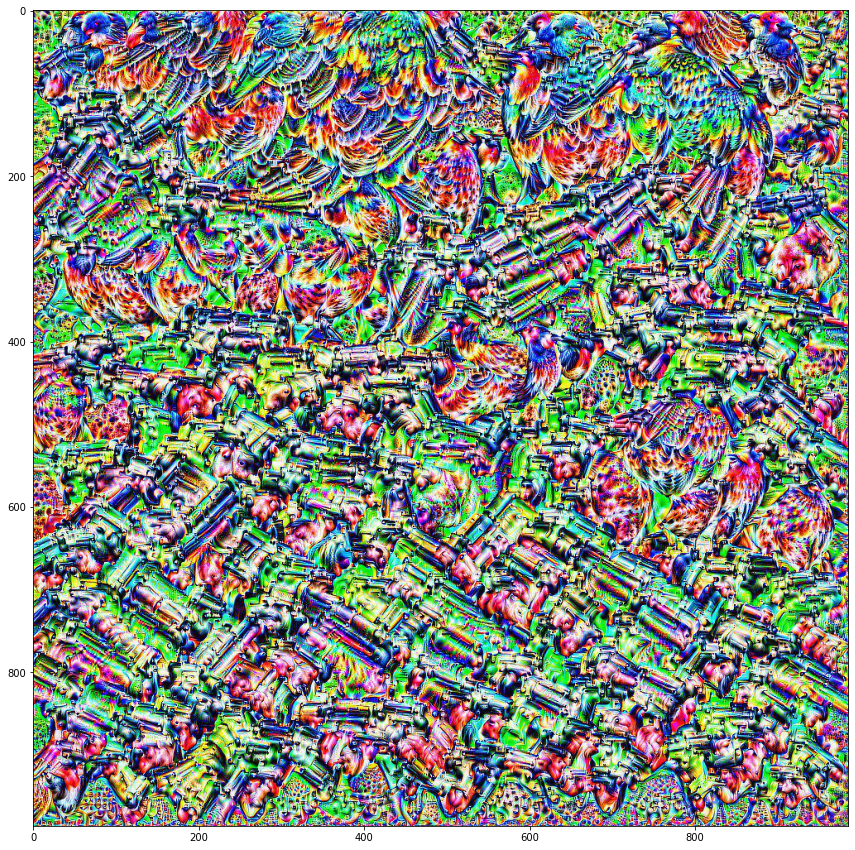

In [23]:
### Model 1 ###
layer = 12
filter = 416      # top #1 feature map for gun class
img, img_name = FV_1.visualize_patterns(layer, filter)
plt.figure(figsize=(15,15))
plt.imshow(np.array(Image.open(img_name)))
plt.show()

### Model #3

## 6.2 Top feature maps for **KNIFE** class

### Model #1

In [49]:
top_feature_map_dict_model_1['knife']

[115, 23, 135, 203, 350, 132]

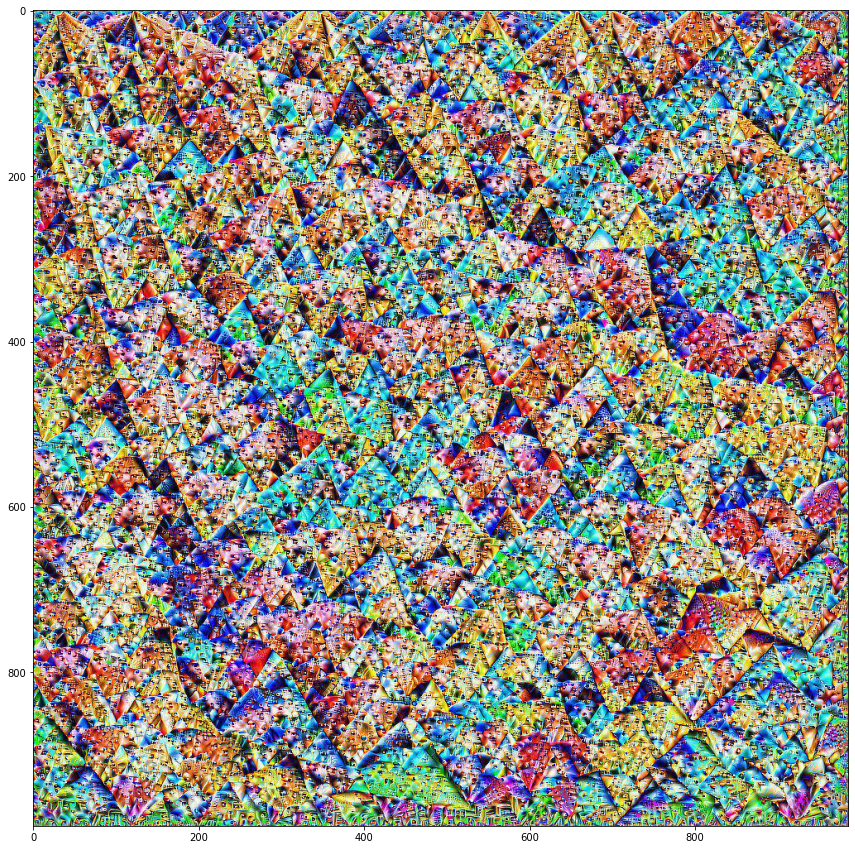

In [26]:
layer = 12
filter = 203
img, img_name = FV_1.visualize_patterns(layer, filter)
plt.figure(figsize=(15,15))
plt.imshow(np.array(Image.open(img_name)))
plt.show()

# 7. Single image, Multiple feature maps using `one_image()`

1. Find top n feature maps for a single image.
2. Highlight each top feature map's most attended regions of the image by overlaying its activation map on top of the image.

## Model #2

In [31]:
top_feature_map_dict_model_2['knife']

[460,
 665,
 1512,
 1144,
 1425,
 249,
 926,
 330,
 385,
 900,
 27,
 1079,
 274,
 295,
 722,
 316,
 1516]

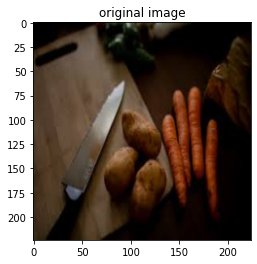

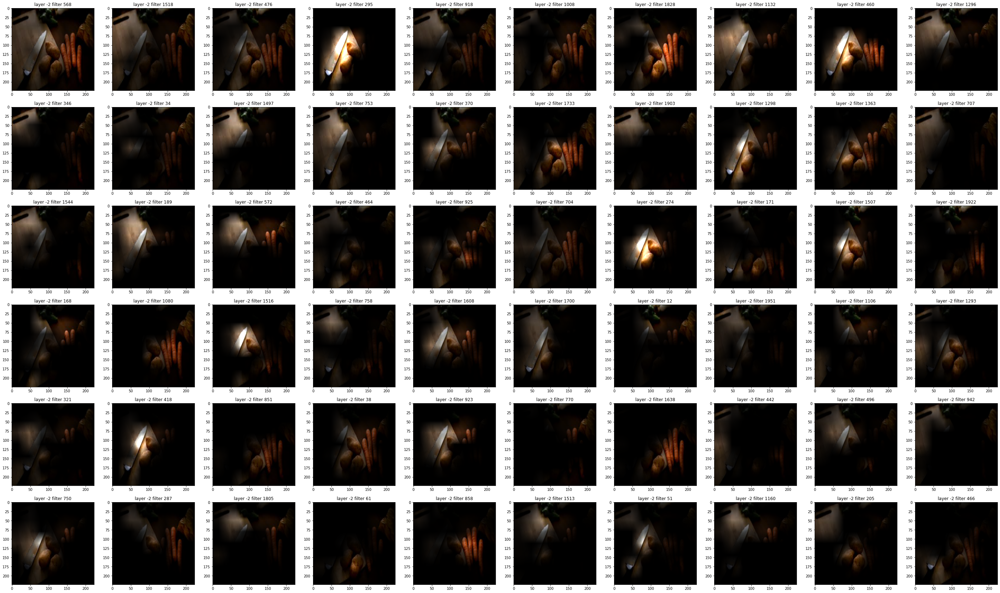

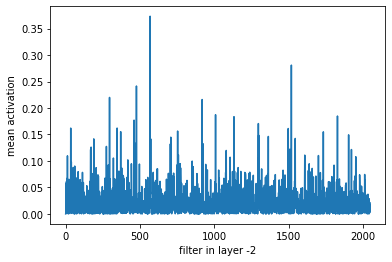

In [35]:
# model 2
layer = -2
activations_list_knife_2_model_2 = FV_2.one_image(layer, img_path="chopping_knife.jpg", n=60, n_plots_horiz=6, n_plots_vert=10, plot_w=50, plot_h=30)

In [ ]:
activations_list_knife_2_model_2[295], activations_list_knife_2_model_2[460]

(tensor(0.2200), tensor(0.1771))

# 8. Multiple images, Single feature map using `one_filter()`

Visualize activations of a single top feature map for multiple images of the same class


## 8.1 Top Feature Map for GUN + **GUN** Images 

### Model #3


In [ ]:
top_feature_map_dict_model_3['gun']

[717,
 1239,
 872,
 405,
 57,
 667,
 445,
 1411,
 747,
 1135,
 31,
 1468,
 971,
 738,
 1065,
 684,
 1421,
 230,
 1146]

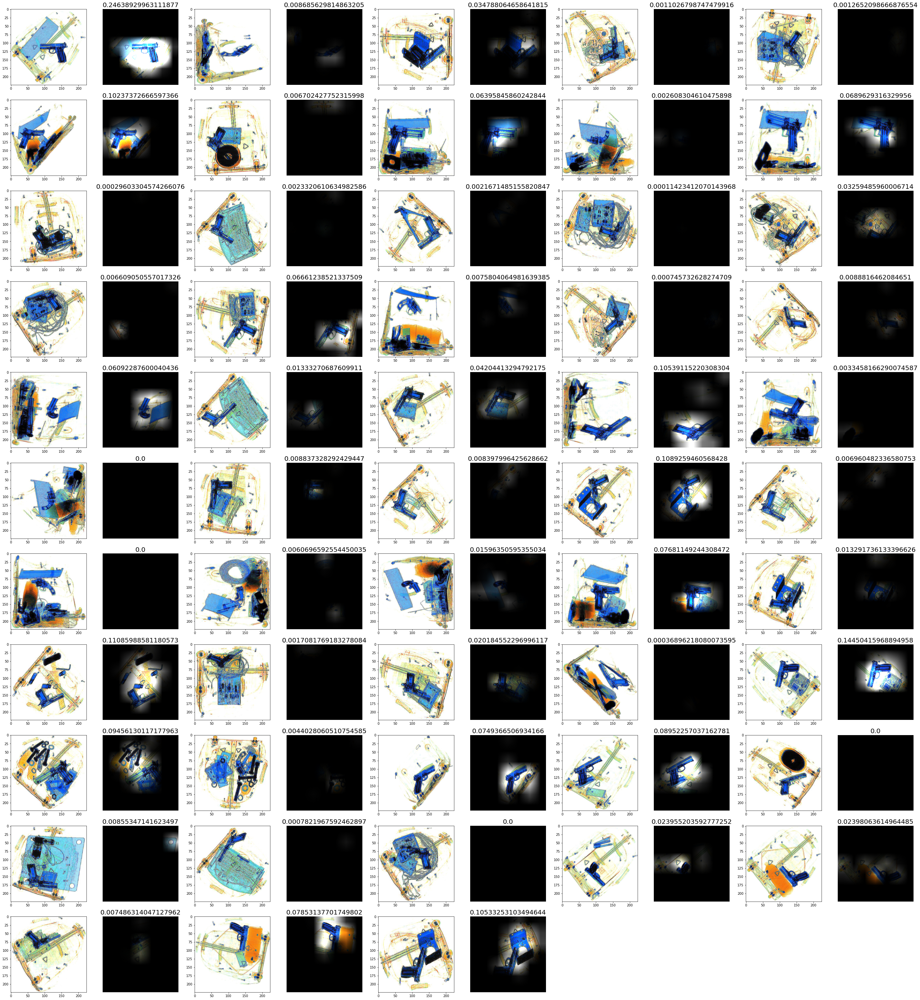

In [67]:
# Model #3, filter 1239 (top #2 feature map for gun class)
activations_list_gun_model_3 = FV_3.one_filter(layer=-2, dataloader=xray_gun_dataloader, filter_idx=1239, class_name="gun", folder="model_3_1239/gun")

## 8.2 Top Feature Map for **KNIFE** + **KNIFE** Images

## Model #3, multiple feature maps
Sum the activations of ALL of knife class's top feature maps 

# 9. Plot Sum of Activations of Top Feature Maps for Each Class

In [53]:
def top_filters_activation(FV, layer, transform, img_dir, top_feature_maps_dict, plot=True, ec=False):
  '''
  ### Visualization #5 ###
     Plot the SUM of activations of each class's top feature maps for each image, 
     for all classes in the same plot
    || PARAMETERS ||
      FV        : (FeatureMapVisualizaer class)
      layer     : (int) if using last convolutional layer, use -2 for resnet & 12 for vgg16
      transform : (torchvision.transforms object)
      img_dir   : (str) address of the folder containing image folders
                  *image folders' names must be the same as target class names 
      top_feature_maps_dict : (dict) (key, value)=(class name, list of top feature maps for that class)
                              e.g. {"cat":[1,3,5], "dog":[2,4,8]}
      plot      : (bool) show plots if True
      ec        : (bool) True if using encoder, False if using the whole model (encoder + classifier)
  '''

  sum_dicts_dict = {}  # will become a dict of dicts
  classes = os.listdir(img_dir)
  for cls_i, cls in enumerate(classes):
    sum_lists_dict = {_cls:[] for _cls in top_feature_maps_dict.keys()}   
    
    for img_path in os.listdir(os.path.join(img_dir, cls)):
      # read in the image and transform it into a torch tensor
      full_img_path = os.path.join(img_dir, cls, img_path)
      img = Image.open(full_img_path).convert('RGB')     
      img_var = transform(img)[:3, :, :].unsqueeze(0).cuda()

      # compute the activations of all feature maps for the image
      activations_list = FV.one_image(layer, img_path=full_img_path, plot=False, optimize_random_img=False, ec=ec)

      # save the sum of only the class top feature maps' activations for each class
      for top_feature_map_cls in top_feature_maps_dict.keys():
        sum_lists_dict[top_feature_map_cls].append(sum(activations_list[top_feature_maps_dict[top_feature_map_cls]]))

    for top_feature_map_cls in top_feature_maps_dict.keys():
      sum_dicts_dict[cls] = sum_lists_dict

  if plot:
    colours = ["pink", "red", "blue"] # add more colours if you have more than 3 classes
    assert len(classes)==len(colours), "# of classes and # of colours must be the same!"
    c = {cls:colour for cls, colour in zip(classes, colours)}
    for top_feature_map_cls in top_feature_maps_dict.keys():
      plt.figure(figsize=(10,7))
      for cls in classes:
        plt.plot(sum_dicts_dict[cls][top_feature_map_cls], marker=".", color=c[cls])
      plt.title(top_feature_map_cls+" activations")
      plt.legend(classes)
      plt.show()

  return sum_dicts_dict

## Model #1

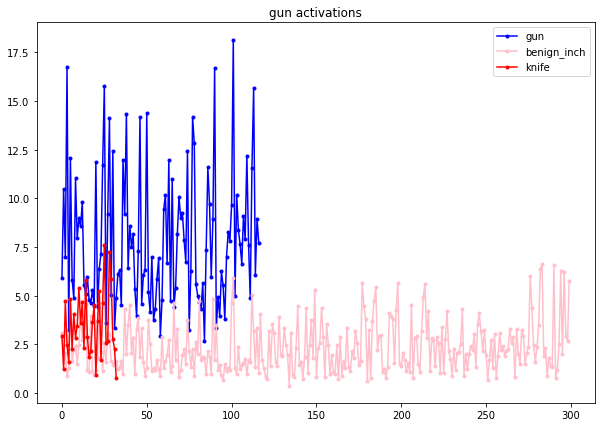

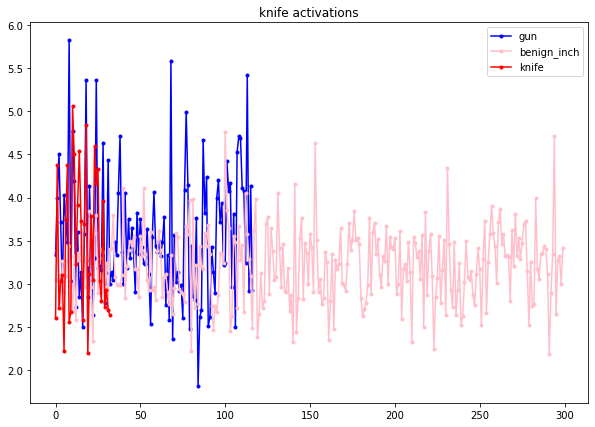

In [49]:
sum_dicts_model_1 = FV_1.plot_sum_of_top_feature_maps(layer=12, 
                                                      transform=transform, 
                                                      img_dir="xray_sh", 
                                                      top_feature_maps_dict={key:value for (key, value) in top_feature_map_dict_model_1.items() if key!="benign"},
                                                      plot=True)

* Left plot for gun class top feature maps shows blue lines (gun Xray images) standing higher than red and pink lines (knife and benign Xray images). 
* Right plot for knife class top feature maps shows large overlap among all three colours. Perhaps this model has a better recall for gun than knife.

# Model #2

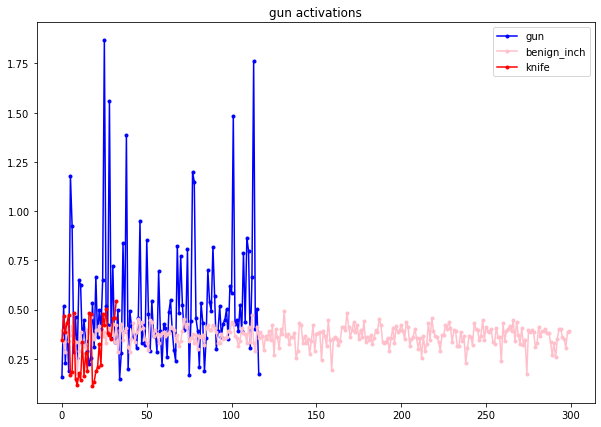

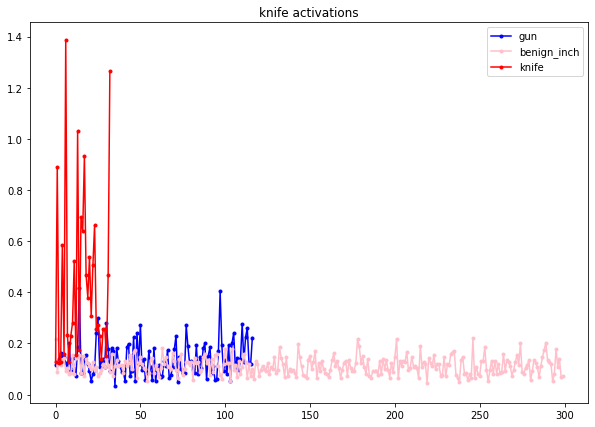

In [51]:
sum_dicts_model_2 = FV_2.plot_sum_of_top_feature_maps(layer=-2, 
                                                      transform=transform, 
                                                      img_dir="xray_sh", 
                                                      top_feature_maps_dict={key:value for (key, value) in top_feature_map_dict_model_2.items() if key!="benign"},
                                                      plot=True)

* Shows improvement for knife class with the right plot showing the red lines (knife Xray images) standing higher than blue and pink lines. 
* Left plot shows some overlap between blue (gun Xray images) and other lines.

# Model #3


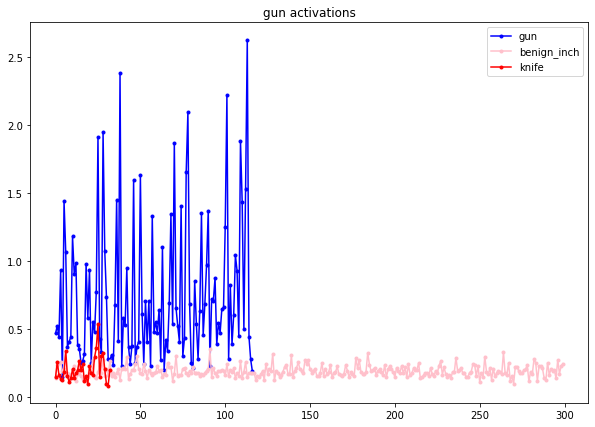

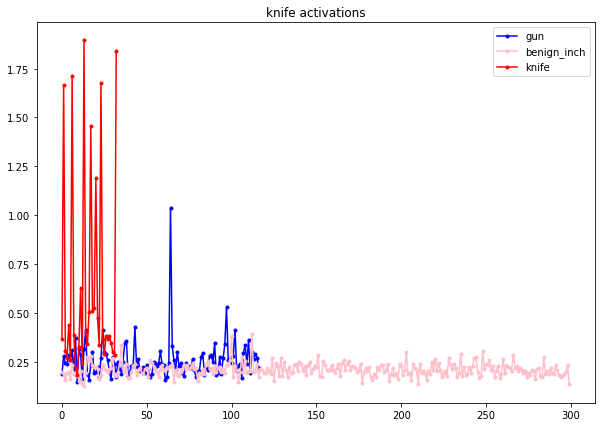

In [53]:
sum_dicts_model_3 = FV_3.plot_sum_of_top_feature_maps(layer=-2, 
                                                      transform=transform, 
                                                      img_dir="xray_sh", 
                                                      top_feature_maps_dict={key:value for (key, value) in top_feature_map_dict_model_3.items() if key!="benign"},
                                                      plot=True)

* Shows great improvement for both plots with distinctly higher sum of activations for both gun and knife classes.
* Left plot (GUN top feature maps) : Blue lines (gun Xray images) stand much higher than red and pink lines (knife and benign Xray images)
* Right plot (KNIFE top feature maps) : Red lines (knife Xray images) stand much higher than blue and pink lines (gun and benign Xray images)